# SESSION 01: IMAGE REPRESENTATION



## Table of Contents

- Ex1_1: Display image in different formats
- Ex1_2: Display different image channels
- Ex1_3: Sampling and Quantization

In [1]:
# load packages
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# connect to GG Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# create a path link to Session folder
PATH = '/content/drive/MyDrive/IVP/Session_01/'

# Font size for figures
FS = 12

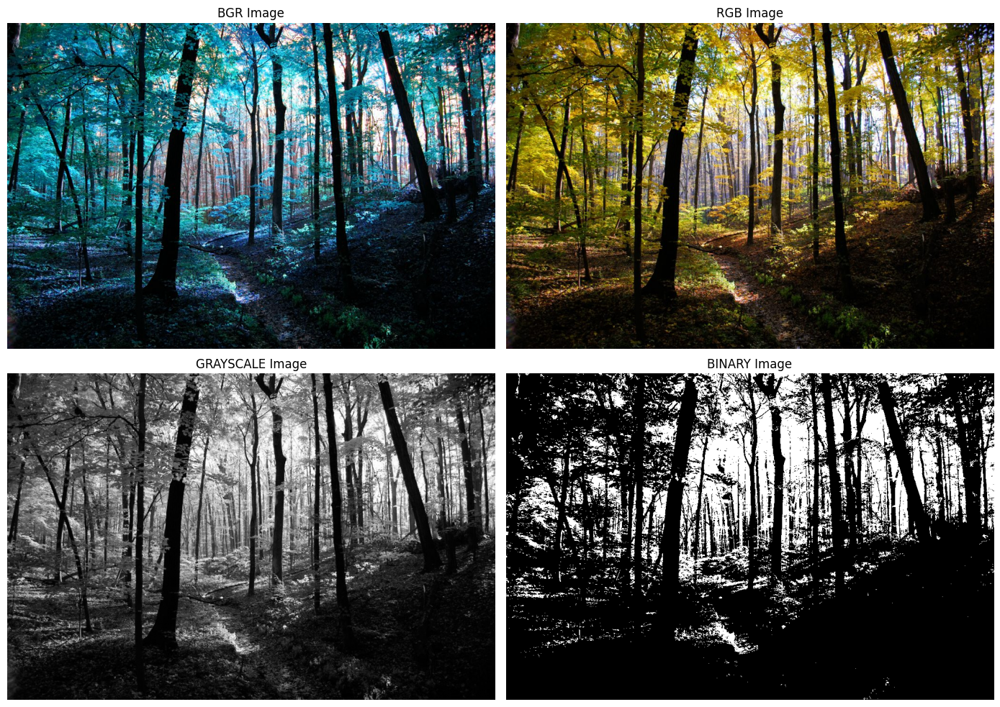

In [4]:

# Ex1_1: Display image in different formats
Img = cv2.imread(PATH + 'forest.jpg')

# Convert from BGR to RGB
Img_color = cv2.cvtColor(Img, cv2.COLOR_BGR2RGB)

# Convert to GRAYSCALE
Img_gray = cv2.cvtColor(Img, cv2.COLOR_BGR2GRAY)

# Convert from GRAYSCALE to BINARY
threshold_val, Img_bw = cv2.threshold(Img_gray, 127, 255, cv2.THRESH_BINARY)


# Display results
plt.figure(figsize=(14,10))

plt.subplot(2,2,1), plt.imshow(Img), plt.title('BGR Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(Img_color), plt.title('RGB Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,3), plt.imshow(Img_gray, cmap='gray'), plt.title('GRAYSCALE Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,4), plt.imshow(Img_bw, cmap='gray'), plt.title('BINARY Image', fontsize=FS), plt.axis('off')

plt.tight_layout()
plt.savefig(PATH + 'Ex1_1.jpg', dpi=400)
plt.show()

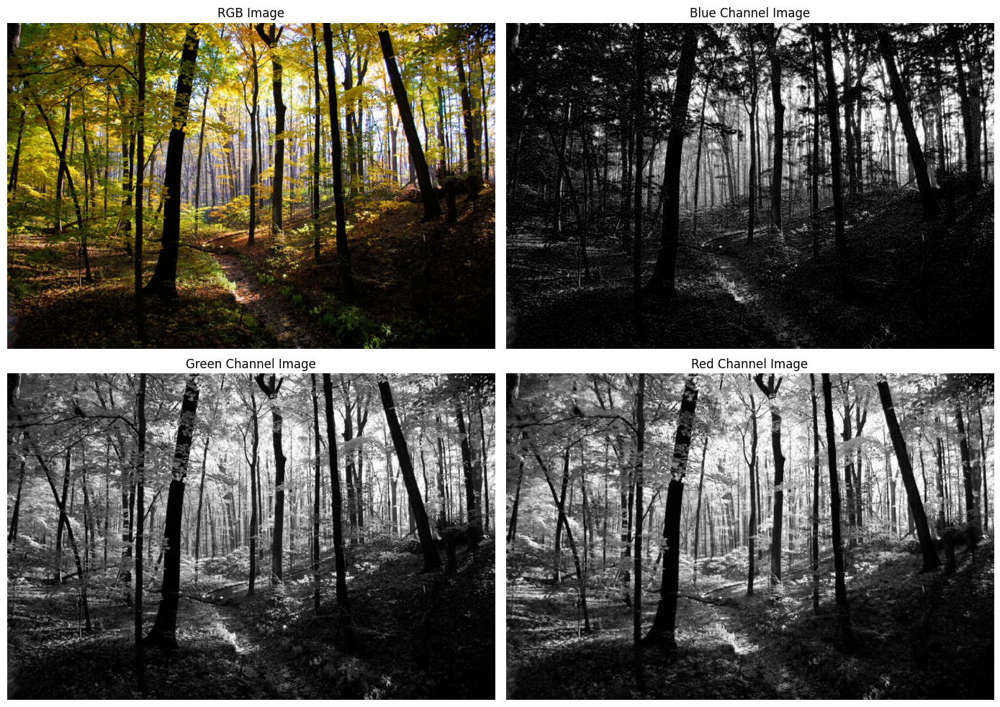

In [5]:
# Ex1_2: Display different image channels

# Split the image into three primary BGR channels
B, G, R = cv2.split(Img)

# Display results
plt.figure(figsize=(14,10))
plt.subplot(2,2,1), plt.imshow(Img_color), plt.title('RGB Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(B, cmap='gray'), plt.title('Blue Channel Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,3), plt.imshow(G, cmap='gray'), plt.title('Green Channel Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,4), plt.imshow(R, cmap='gray'), plt.title('Red Channel Image', fontsize=FS), plt.axis('off')

plt.tight_layout()
plt.savefig(PATH + 'Ex1_2a.jpg', dpi=400)
plt.show()

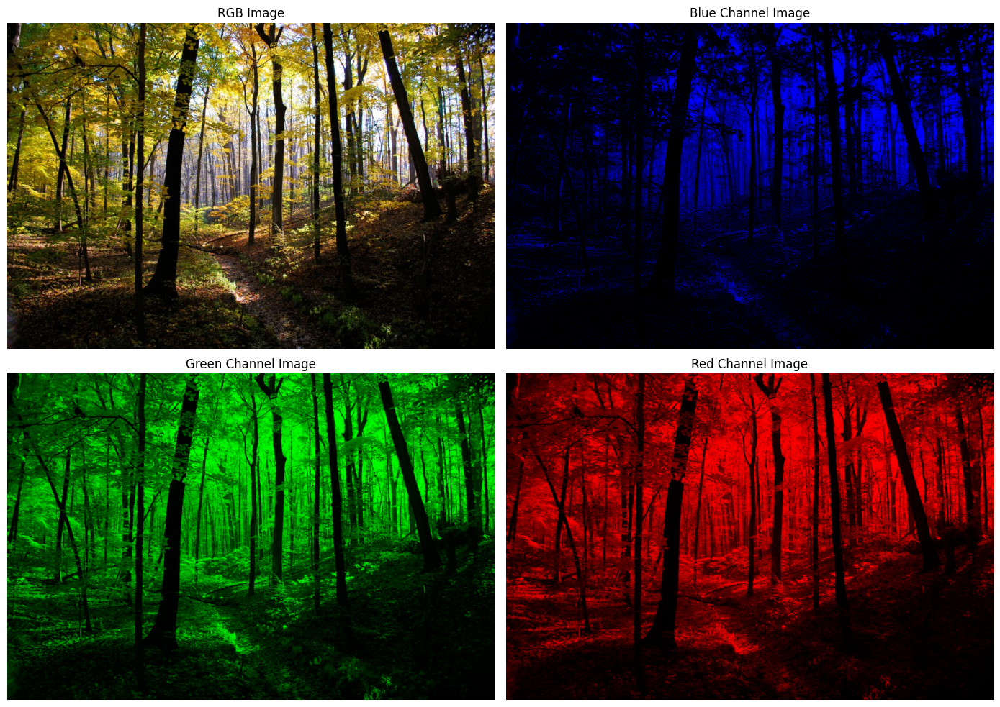

In [6]:
# Display each RGB channel as a monochromatic image

# Create empty channel the shape shape with the image
zeros = np.zeros_like(Img_gray)

# Reconstuct each channel as a color image by zeroing out the other channels
R_color = cv2.merge([R, zeros, zeros]) # Red only
G_color = cv2.merge([zeros, G, zeros]) # Green only
B_color = cv2.merge([zeros, zeros, B]) # Blue only

# Display results
plt.figure(figsize=(14,10))
plt.subplot(2,2,1), plt.imshow(Img_color), plt.title('RGB Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(B_color), plt.title('Blue Channel Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,3), plt.imshow(G_color), plt.title('Green Channel Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,4), plt.imshow(R_color), plt.title('Red Channel Image', fontsize=FS), plt.axis('off')

plt.tight_layout()
plt.savefig(PATH + 'Ex1_2b.jpg', dpi=400)
plt.show()

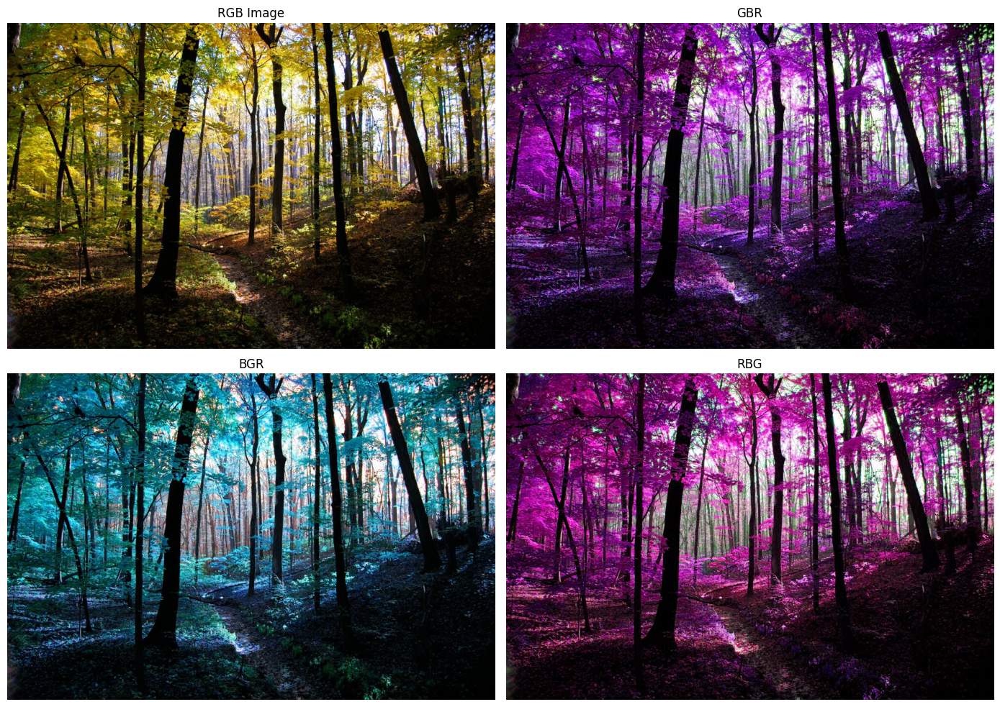

In [7]:
# Display color image in different layouts

# Rearrange the three channels into diffent orders
GBR = cv2.merge([G, B, R]) #GBR
BGR = cv2.merge([B, G, R]) #BGR
RBG = cv2.merge([R, B, G]) #RBG


# Display results
plt.figure(figsize=(14,10))
plt.subplot(2,2,1), plt.imshow(Img_color), plt.title('RGB Image', fontsize=FS), plt.axis('off')
plt.subplot(2,2,2), plt.imshow(GBR), plt.title('GBR', fontsize=FS), plt.axis('off')
plt.subplot(2,2,3), plt.imshow(BGR), plt.title('BGR', fontsize=FS), plt.axis('off')
plt.subplot(2,2,4), plt.imshow(RBG), plt.title('RBG', fontsize=FS), plt.axis('off')

plt.tight_layout()
plt.savefig(PATH + 'Ex1_2c.jpg', dpi=400)
plt.show()

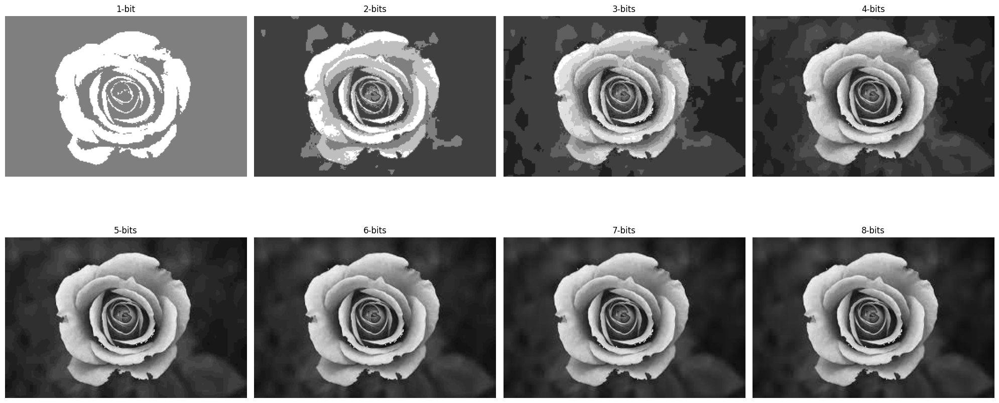

In [8]:
from PIL.Image import Quantize

# Ex1_3: Sampling and Quantization

Img = cv2.imread(PATH + 'rose.jpg')

# Convert from integer to double format (from 0 -> 255 to 0.0000 -> 255.0000)
Img = Img.astype(np.float64)

# quantize and display image in different. number of bits (from 1 to 8 bits)
plt.figure(figsize=(20,10))
for num_bits in range(1,9):
  # number of gray levels
  num_levels = 2 ** num_bits

  # level gap for each level
  level_gap = 256 / num_levels

  # quantize image
  quantitized_img = np.uint8(np.ceil(Img / level_gap) * level_gap - 1)
  quantitized_img = np.clip(quantitized_img, 0, 255)

  # display image
  plt.subplot(2, 4, num_bits), plt.imshow(quantitized_img)
  title = f'{num_bits}-bit' if 1 == num_bits else f'{num_bits}-bits'
  plt.title(title, fontsize=FS), plt.axis('off')

plt.tight_layout()
plt.savefig(PATH + 'Ex1_3.jpg', dpi=400)
plt.show()

## Notes
<a id='notes'></a>

**Số pixel** = số viên gạch nhỏ ghép thành bức tranh

Càng nhiều gạch → tranh càng chi tiết, mịn
Ít gạch → nhìn xa thì OK, lại gần thấy lổn nhổn


**Bit depth** = số màu có sẵn trong "hộp màu" để tô từng viên gạch

Hộp 2 màu (1 bit) → chỉ tô được đen/trắng

Hộp 256 màu (8 bit) → tô được nhiều sắc độ

Hộp 16 triệu màu (24 bit) → tô gần như mọi màu mắt người thấy